# Step - 1 Preprocessing

### 1.1 Importing Essential Libraries for Image Super-Resolution

This cell sets up the project by importing libraries required for data manipulation, model building, and visualization. Each library plays a specific role in the workflow of image processing and deep learning. The goal of this project is to enhance the resolution of images using a convolutional autoencoder model, which requires a combination of efficient data handling, model structuring, and real-time monitoring.

- **`numpy` and `pandas`**: These are used for data handling and array manipulations, helping with structured data formats and efficient computations.
- **`os` and `re`**: `os` facilitates file management, and `re` allows for regular expressions, which might be useful in file naming conventions or path management.
- **`tensorflow.keras` layers**:
  - **`Conv2D`, `MaxPooling2D`, `UpSampling2D`**: Core layers for constructing the autoencoder model. Convolutional layers extract features, pooling layers reduce spatial dimensions, and upsampling layers recover the original image resolution.
  - **`ModelCheckpoint`, `EarlyStopping`, `ReduceLROnPlateau`**: Callbacks to manage model training, prevent overfitting, and adaptively control the learning rate.
- **`matplotlib.pyplot`**: Visualization library for plotting model metrics and visual comparisons between input and output images.

This foundation enables us to proceed to data preparation and model construction, setting up an environment to build, train, and visualize an autoencoder model for enhancing image resolution.


In [ ]:
import numpy as np
import pandas as pd
import os
import re
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Conv2D, MaxPooling2D, Dropout, Conv2DTranspose, UpSampling2D, add
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.python.keras.preprocessing.image import ImageDataGenerator
from tensorflow.python.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt

### 1.2 Defining Function to Create Low-Resolution Images

In this cell, we define the function `create_low_res_image`, which generates low-resolution versions of high-resolution images. This is essential as we need paired low- and high-resolution images to train our autoencoder model. By resizing high-resolution images, we simulate the lower quality that the model will learn to enhance.

- **Function `create_low_res_image(high_res_path, output_path, scale_factor=2)`**:
  - **`high_res_path`**: Path to the high-resolution input image.
  - **`output_path`**: Directory where the generated low-resolution image will be saved.
  - **`scale_factor`**: Determines the downscaling ratio (default is 2, meaning the image will be half its original dimensions).

The cell also creates folders and iterates through high-resolution images to save their downscaled versions in the specified output folder. This setup allows the autoencoder model to learn the mapping between low- and high-resolution images, a key requirement for training the super-resolution model.


In [ ]:
from PIL import Image
import os

def create_low_res_image(high_res_path, output_path, scale_factor=2):
    img = Image.open(high_res_path)

    width, height = img.size

    new_width = width // scale_factor
    new_height = height // scale_factor

    img_low_res = img.resize((new_width, new_height), Image.ANTIALIAS)

    base_name = os.path.basename(high_res_path)
    name, ext = os.path.splitext(base_name)
    new_file_name = f"{name}_2{ext}"
    img_low_res.save(os.path.join(output_path, new_file_name))
base_directory = '/content/drive/MyDrive/DIP_Project/ImageSuperResolution'
high_res_folder = os.path.join(base_directory, 'high res')
low_res_folder_ne = '/content/working/low_res_images_ne'

os.makedirs(low_res_folder_ne, exist_ok=True)


for filename in os.listdir(high_res_folder):
    if filename.endswith(('.jpg', '.png', '.jpeg')):
        high_res_path = os.path.join(high_res_folder, filename)
        create_low_res_image(high_res_path, low_res_folder_ne, scale_factor=2)


### 1.3 Loading and Preparing Image Data

This cell loads image data from a CSV file containing paths to low and high-resolution images. It then modifies the file paths to match the directories used in this project and selects a subset of the data to streamline the training process.

- **`data = pd.read_csv(...)`**: Reads the image data CSV file into a `DataFrame`.
- **`data['low_res']` and `data['high_res']`**: Update file paths for low and high-resolution images.
- **`subset_data = data.iloc[:400]`**: Selects the first 400 images for faster experimentation.
- **`data.head()`**: Displays the first few rows of the dataset to confirm that paths have been updated correctly.

This cell ensures that the model will access the correct files, with pairs of low- and high-resolution images organized for training and validation. In the next steps, these image paths are used for creating data generators.


In [ ]:
data = pd.read_csv("../input/image-super-resolution-from-unsplash/Image Super Resolution - Unsplash/image_data.csv")
data['low_res'] = data['low_res'].apply(lambda x: os.path.join(low_res_folder_ne,x))
data['high_res'] = data['high_res'].apply(lambda x: os.path.join(high_res_folder,x))
subset_data = data.iloc[:400]
data.head()


,low_res,high_res
0,/kaggle/working/low_res_images_ne/1_2.jpg,../input/image-super-resolution-from-unsplash/...
1,/kaggle/working/low_res_images_ne/2_2.jpg,../input/image-super-resolution-from-unsplash/...
2,/kaggle/working/low_res_images_ne/3_2.jpg,../input/image-super-resolution-from-unsplash/...
3,/kaggle/working/low_res_images_ne/4_2.jpg,../input/image-super-resolution-from-unsplash/...
4,/kaggle/working/low_res_images_ne/5_2.jpg,../input/image-super-resolution-from-unsplash/...


# 2. Data Preparation for Training

### 2.1 Creating Image Data Generators for Training and Validation

Using `ImageDataGenerator`, this cell prepares the training and validation datasets. The data generators perform rescaling and batching, and also handle splitting the data into training and validation subsets.

- **Variables**:
  - **`batch_size = 4`**: Sets the number of samples per batch.
  - **`image_datagen` and `mask_datagen`**: Data generators for augmenting and rescaling images to normalize pixel values.
- **Training and Validation Generators**:
  - **`train_hiresimage_generator`** and **`train_lowresimage_generator`**: Generate batches of high- and low-resolution images for training.
  - **`val_hiresimage_generator`** and **`val_lowresimage_generator`**: Generate batches for validation.

The training and validation generators are zipped using `train_generator` and `val_generator`, respectively, so that each batch contains paired low- and high-resolution images. These data generators will feed into the model, preparing it to learn how to reconstruct high-resolution images.


In [ ]:
batch_size = 4

image_datagen = ImageDataGenerator(rescale=1./255,validation_split=0.15)
mask_datagen = ImageDataGenerator(rescale=1./255,validation_split=0.15)

train_hiresimage_generator = image_datagen.flow_from_dataframe(
        subset_data,
        x_col='high_res',
        target_size=(800, 1200),
        class_mode = None,
        batch_size = batch_size,
        seed=42,
        subset='training')

train_lowresimage_generator = image_datagen.flow_from_dataframe(
        subset_data,
        x_col='low_res',
        target_size=(800, 1200),
        class_mode = None,
        batch_size = batch_size,
        seed=42,
        subset='training')

val_hiresimage_generator = image_datagen.flow_from_dataframe(
        subset_data,
        x_col='high_res',
        target_size=(800, 1200),
        class_mode = None,
        batch_size = batch_size,
        seed=42,
        subset='validation')

val_lowresimage_generator = image_datagen.flow_from_dataframe(
        subset_data,
        x_col='low_res',
        target_size=(800, 1200),
        class_mode = None,
        batch_size = batch_size,
        seed=42,
        subset='validation')

train_generator = zip(train_lowresimage_generator, train_hiresimage_generator)
val_generator = zip(val_lowresimage_generator, val_hiresimage_generator)

def imageGenerator(train_generator):
    for (low_res, hi_res) in train_generator:
            yield (low_res, hi_res)

Found 340 validated image filenames.
Found 340 validated image filenames.
Found 60 validated image filenames.
Found 60 validated image filenames.


### 2.2 Visualizing Sample Low and High-Resolution Images

This cell provides a visual check by displaying a sample low-resolution image alongside its high-resolution counterpart. Visualizing these pairs ensures that the dataset is correctly set up for the model.

- **Variables**:
  - **`img`** and **`out`**: Represent a pair of low- and high-resolution images.
- **Visualization**:
  - **`fig, axs` and `fig_1, axs_1`**: Create separate figures to show low- and high-resolution images.

By verifying that the images are paired correctly, we can confidently proceed to model building. This visualization is an essential quality check, ensuring that the model input aligns with the intended data structure.


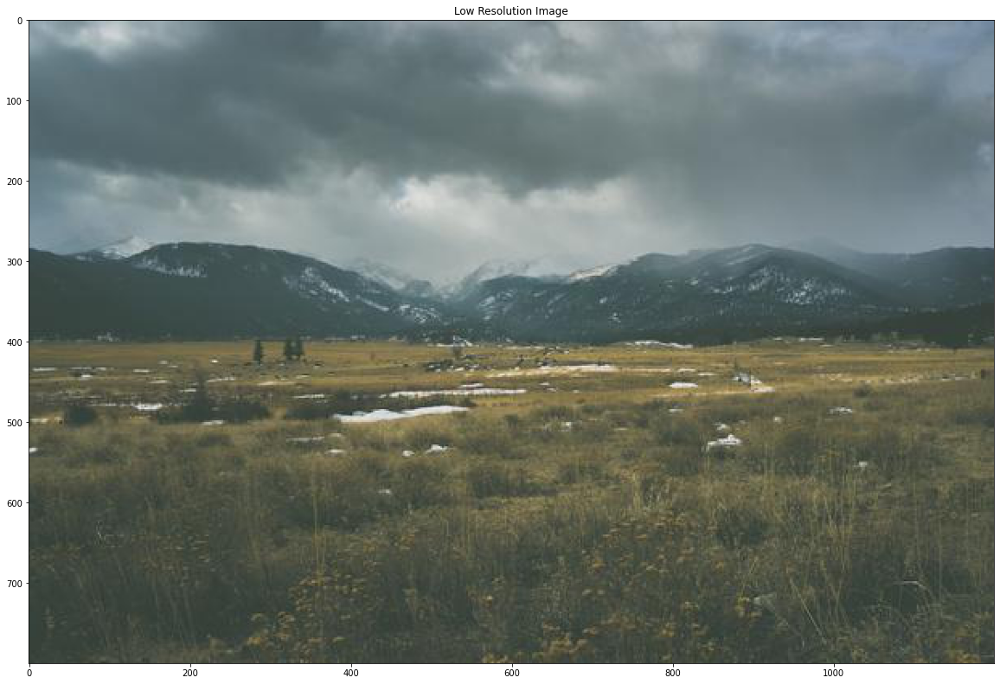

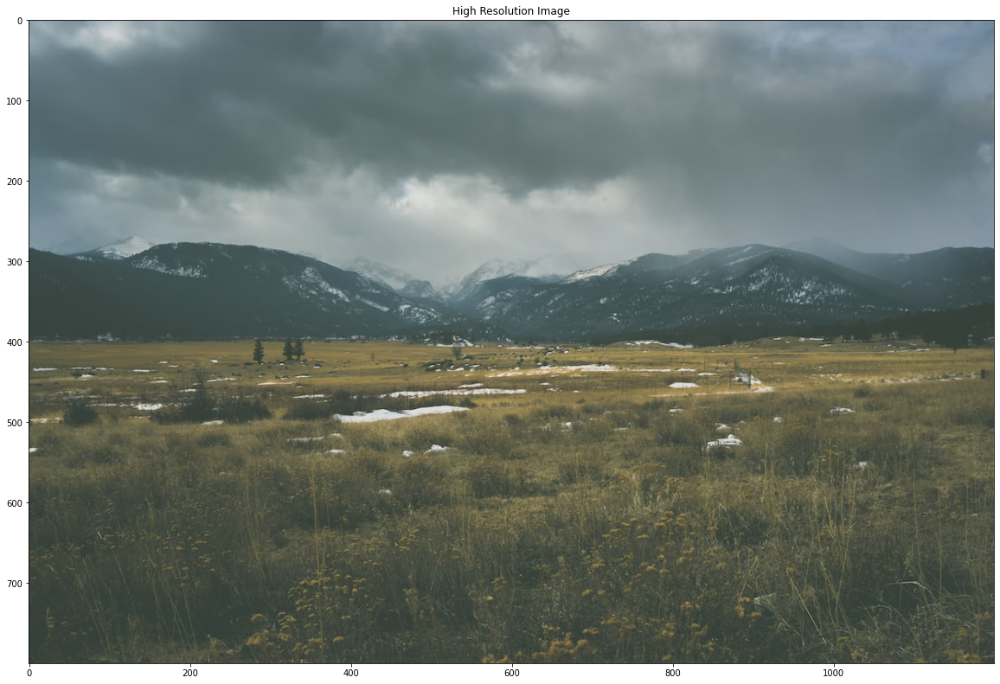

In [ ]:
for i,m in train_generator:
    img,out = i,m
    fig, axs = plt.subplots(1 , 1, figsize=(20,20))
    fig_1, axs_1 = plt.subplots(1 , 1, figsize=(20,20))
    axs.imshow(img[0])
    axs.set_title('Low Resolution Image')
    axs_1.imshow(out[0])
    axs_1.set_title('High Resolution Image')
    plt.show()
    break

# 3. Model Building

### 3.1 Constructing the Convolutional Autoencoder Model

In this cell, we define the structure of the convolutional autoencoder model, an essential component of this project. An autoencoder is a neural network that compresses input data into a lower-dimensional form and then reconstructs it, which is useful for tasks like super-resolution.

- **Layers**:
  - **`Conv2D` layers**: Extract features at various levels. These layers capture patterns in low-resolution images that aid in reconstructing high-resolution outputs.
  - **`MaxPooling2D` and `UpSampling2D` layers**: Downsample and upsample the image dimensions, respectively. Pooling reduces spatial size, while upsampling increases it.
  - **`Dropout` layers**: Prevent overfitting by randomly disabling neurons during training.
  - **`add` layers**: Combine layers to retain high-level information, improving the final reconstructed output.

The autoencoder model is compiled with `mean_squared_error` as the loss function, as it measures the difference between pixel values in low- and high-resolution images, optimizing for accurate reconstructions. The model now awaits training to learn the mappings between input and output images.


In [ ]:
input_img = Input(shape=(800, 1200, 3))

l1 = Conv2D(64, (3, 3), padding='same', activation='relu')(input_img)
l2 = Conv2D(64, (3, 3), padding='same', activation='relu')(l1)
l3 = MaxPooling2D(padding='same')(l2)
l3 = Dropout(0.3)(l3)
l4 = Conv2D(128, (3, 3),  padding='same', activation='relu')(l3)
l5 = Conv2D(128, (3, 3), padding='same', activation='relu')(l4)
l6 = MaxPooling2D(padding='same')(l5)
l7 = Conv2D(256, (3, 3), padding='same', activation='relu')(l6)

l8 = UpSampling2D()(l7)

l9 = Conv2D(128, (3, 3), padding='same', activation='relu')(l8)
l10 = Conv2D(128, (3, 3), padding='same', activation='relu')(l9)

l11 = add([l5, l10])
l12 = UpSampling2D()(l11)
l13 = Conv2D(64, (3, 3), padding='same', activation='relu')(l12)
l14 = Conv2D(64, (3, 3), padding='same', activation='relu')(l13)

l15 = add([l14, l2])

decoded = Conv2D(3, (3, 3), padding='same', activation='relu')(l15)

autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mean_squared_error', metrics=['accuracy'])

### 3.2 Summarizing the Model Architecture

This cell outputs the model’s summary, providing a detailed view of the architecture, layer types, and parameter counts. Reviewing this summary helps verify that the model structure aligns with the design intended for super-resolution.

- **Layer Information**: Lists each layer's type, output shape, and the number of trainable parameters.
- **Total Parameters**: Shows the total count of trainable parameters, which affects the model's capacity and computation requirements.

The model summary offers a chance to inspect the architecture and confirm that each layer type and shape will work as expected in reconstructing high-resolution images from low-resolution inputs.


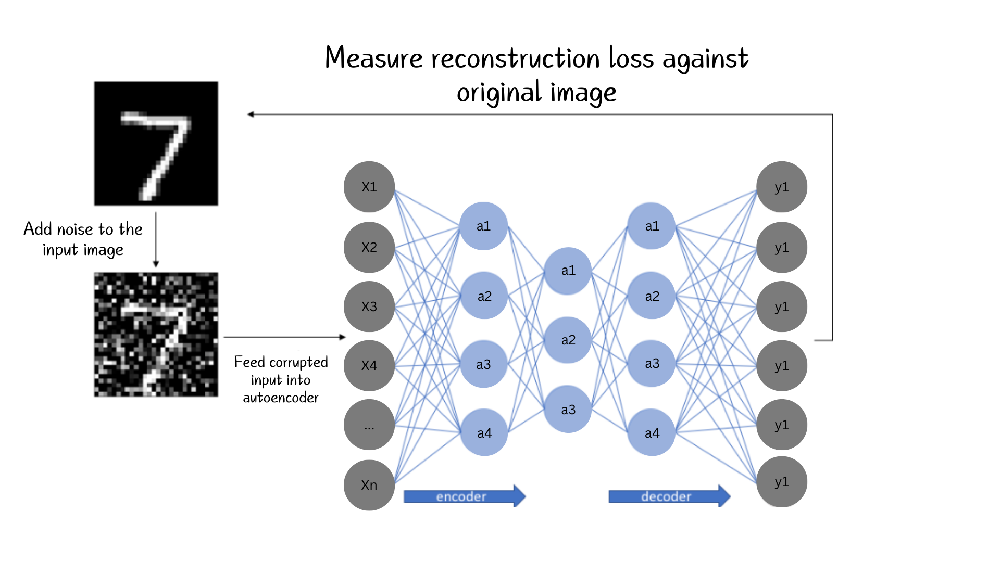

In [ ]:
autoencoder.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 800, 1200, 3 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 800, 1200, 64 1792        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 800, 1200, 64 36928       conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 400, 600, 64) 0           conv2d_1[0][0]                   
______________________________________________________________________________________________

# 4. Model Training

### 4.1 Preparing Data for Model Training

This cell organizes data generators for feeding training and validation samples into the model during training. It also provides a generator function, `imageGenerator`, which yields pairs of low- and high-resolution images.

- **Variables**:
  - **`train_samples` and `val_samples`**: Represent the number of training and validation samples.
  - **`train_img_gen` and `val_image_gen`**: Generators for batching images.
  
The data generators yield batches, supporting efficient processing as the model trains on successive image pairs. The training process continues in the following cell, where we define callbacks and begin model training.


In [ ]:
train_samples = train_hiresimage_generator.samples
val_samples = val_hiresimage_generator.samples

train_img_gen = imageGenerator(train_generator)
val_image_gen = imageGenerator(val_generator)

### 4.2 Configuring Callbacks to Optimize Training

To control the training process, we set up callbacks that monitor performance and adjust as needed. These callbacks save the best model, halt training early if necessary, and reduce the learning rate when progress slows.

- **Callbacks**:
  - **`ModelCheckpoint`**: Saves the model when validation loss improves.
  - **`EarlyStopping`**: Stops training if validation loss fails to improve, helping avoid overfitting.
  - **`ReduceLROnPlateau`**: Lowers the learning rate if progress plateaus, encouraging the model to reach optimal results.

With these callbacks in place, the model is primed for efficient and effective training in the next cell.


In [ ]:
model_path = "autoencoder.h5"
checkpoint = ModelCheckpoint(model_path,
                             monitor="val_loss",
                             mode="min",
                             save_best_only = True,
                             verbose=1)

earlystop = EarlyStopping(monitor = 'val_loss',
                          min_delta = 0,
                          patience = 9,
                          verbose = 1,
                          restore_best_weights = True)

learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss',
                                            patience=5,
                                            verbose=1,
                                            factor=0.2,
                                            min_lr=0.00000001)

### 4.3 Training the Autoencoder Model

Here, we initiate the training process, passing the training and validation generators into the model with the defined callbacks to monitor progress. Training involves multiple epochs where the model learns to transform low-resolution images into high-resolution outputs.

- **Training Process**:
  - **`epochs=8`**: Sets the number of epochs for training.
  - **`callbacks`**: Monitors performance through checkpoints, early stopping, and learning rate adjustments.

As the training progresses, the model optimizes its parameters to minimize the error between predicted and actual high-resolution images, with results logged for each epoch.


In [ ]:
hist = autoencoder.fit(train_img_gen,
                    steps_per_epoch=train_samples//batch_size,
                    validation_data=val_image_gen,
                    validation_steps=val_samples//batch_size,
                    epochs=8, callbacks=[earlystop, checkpoint, learning_rate_reduction])

Epoch 1/8
85/85 [==============================] - 107s 1s/step - loss: 0.0206 - accuracy: 0.6085 - val_loss: 0.0017 - val_accuracy: 0.8071

Epoch 00001: val_loss improved from inf to 0.00168, saving model to autoencoder.h5
Epoch 2/8


/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


85/85 [==============================] - 88s 1s/step - loss: 0.0015 - accuracy: 0.7971 - val_loss: 0.0012 - val_accuracy: 0.8838

Epoch 00002: val_loss improved from 0.00168 to 0.00117, saving model to autoencoder.h5
Epoch 3/8
85/85 [==============================] - 88s 1s/step - loss: 0.0012 - accuracy: 0.8500 - val_loss: 0.0012 - val_accuracy: 0.8806

Epoch 00003: val_loss did not improve from 0.00117
Epoch 4/8
85/85 [==============================] - 89s 1s/step - loss: 0.0012 - accuracy: 0.8701 - val_loss: 0.0013 - val_accuracy: 0.7590

Epoch 00004: val_loss did not improve from 0.00117
Epoch 5/8
85/85 [==============================] - 89s 1s/step - loss: 0.0013 - accuracy: 0.8628 - val_loss: 0.0012 - val_accuracy: 0.8636

Epoch 00005: val_loss improved from 0.00117 to 0.00116, saving model to autoencoder.h5
Epoch 6/8
85/85 [==============================] - 89s 1s/step - loss: 0.0011 - accuracy: 0.8666 - val_loss: 0.0012 - val_accuracy: 0.8427

Epoch 00006: val_loss improved fro

# 5. Model Evaluation

### 5.1 Plotting Model Loss for Training and Validation

This cell visualizes the model’s loss over epochs to assess performance trends and identify any overfitting or underfitting.

- **Loss Plot**:
  - **Training Loss**: Shown in one color to represent training error.
  - **Validation Loss**: Shown in another color to indicate generalization ability.

This plot provides insight into model performance, helping refine or adjust hyperparameters as necessary.


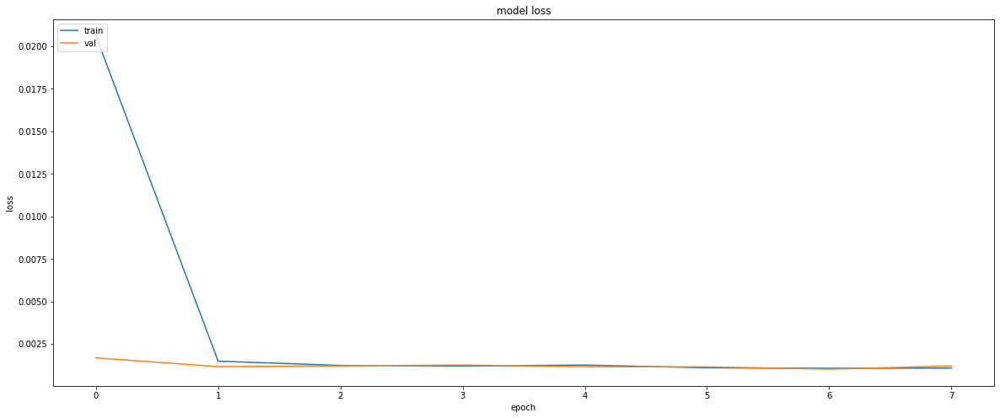

In [ ]:
plt.figure(figsize=(20,8))
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

### 5.2 Evaluating the Model on Test Images

This cell evaluates the trained model by testing it on new low-resolution images, enabling us to assess its ability to generate high-resolution images. We input test images, obtain predicted high-resolution outputs, and compare these results visually.

- **Testing Process**:
  - **`test_image`**: Low-resolution test input that is fed to the model.
  - **`predicted_image`**: High-resolution output generated by the model from `test_image`.
- **Result Visualization**: Side-by-side comparison of `test_image` and `predicted_image`, allowing us to visually evaluate the quality of the reconstructed image.

This evaluation helps determine the model’s practical effectiveness, showing how well it can generalize to new data and reconstruct high-resolution images that closely resemble the original high-res targets.


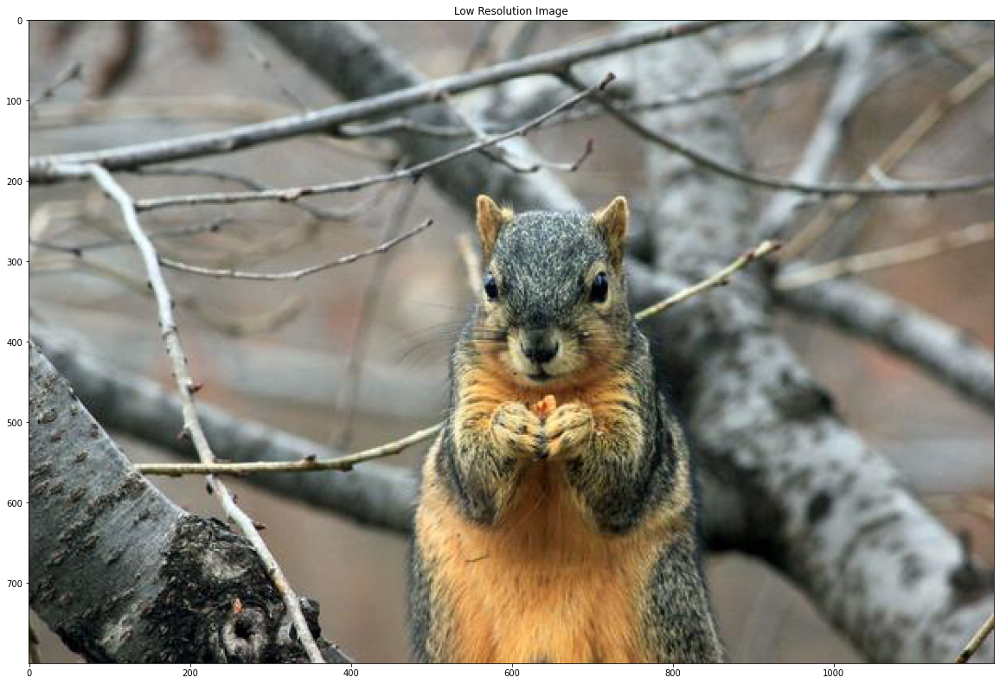

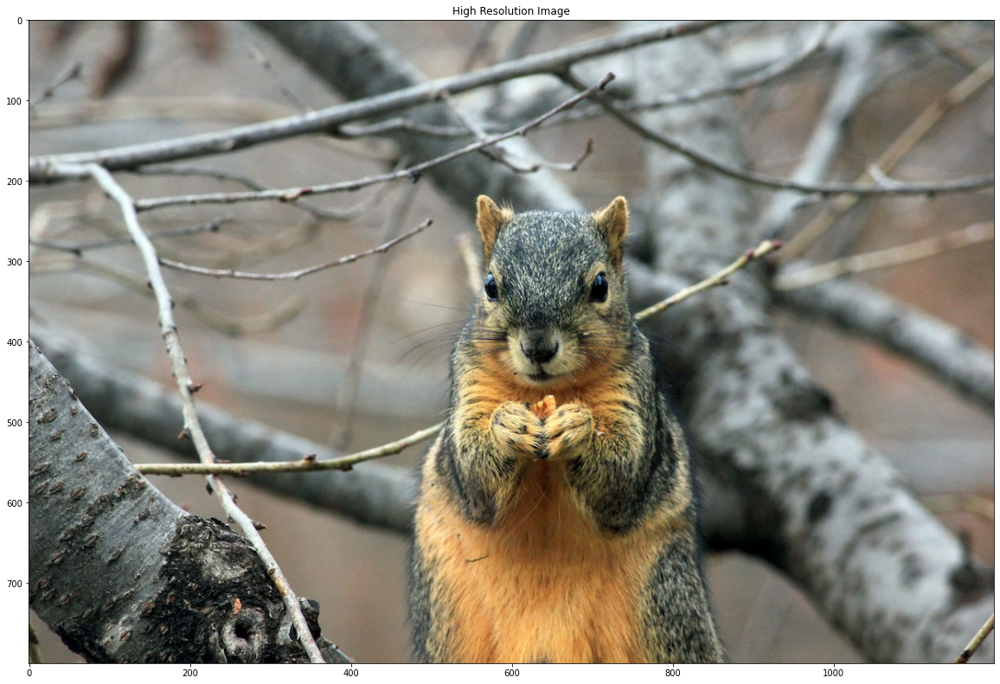

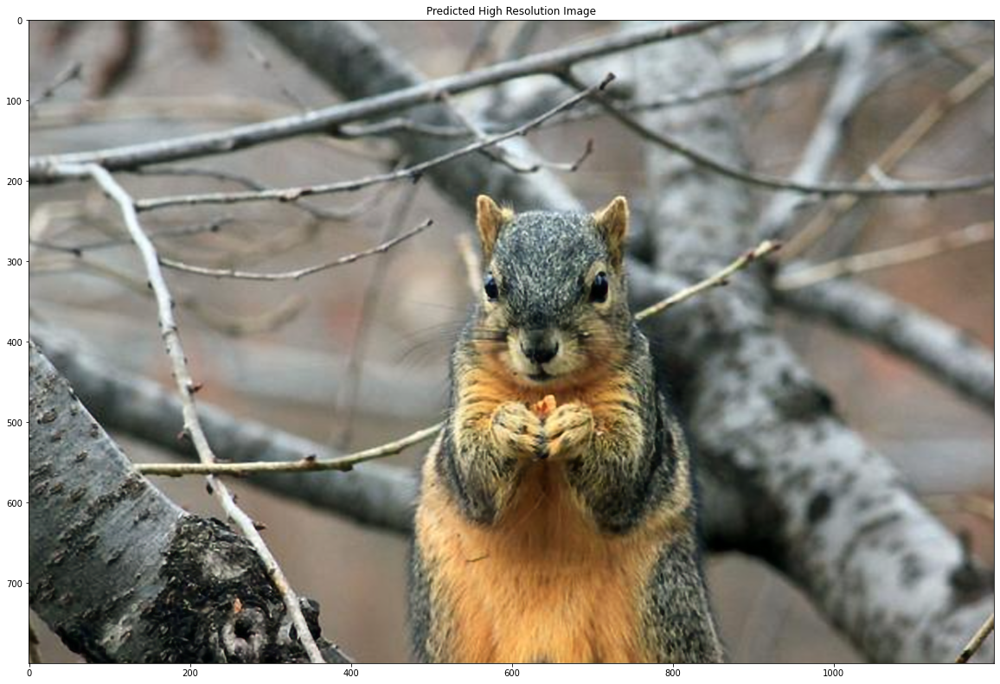

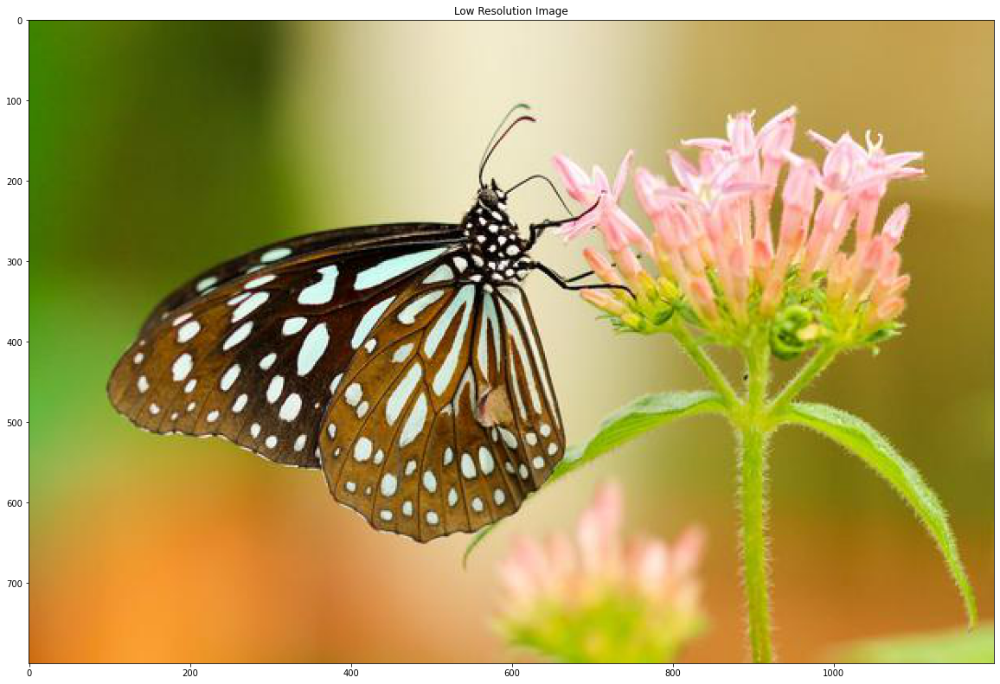

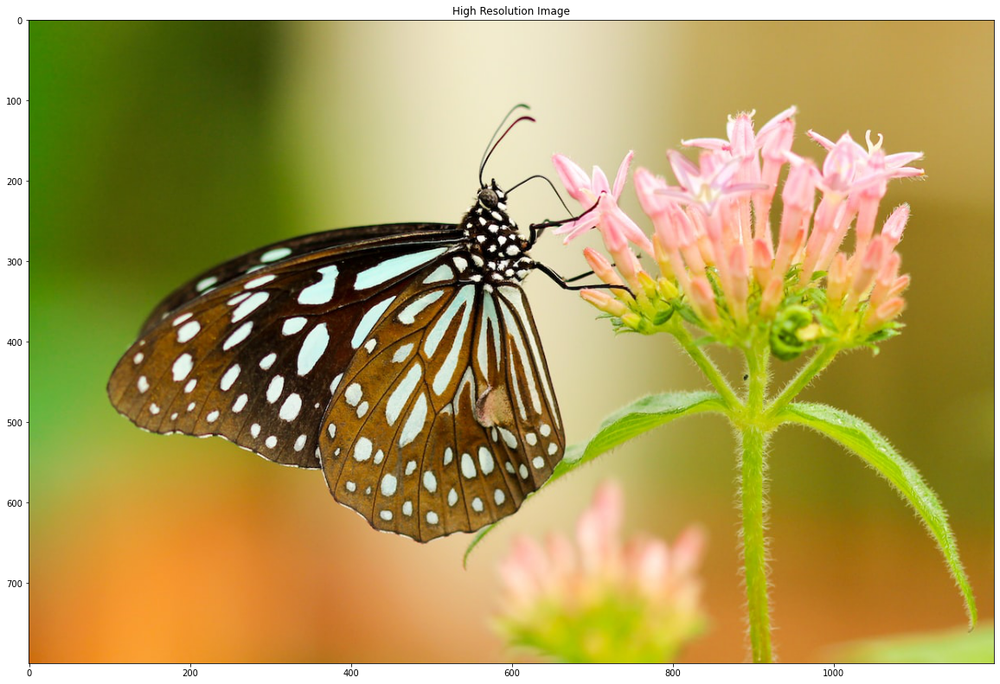

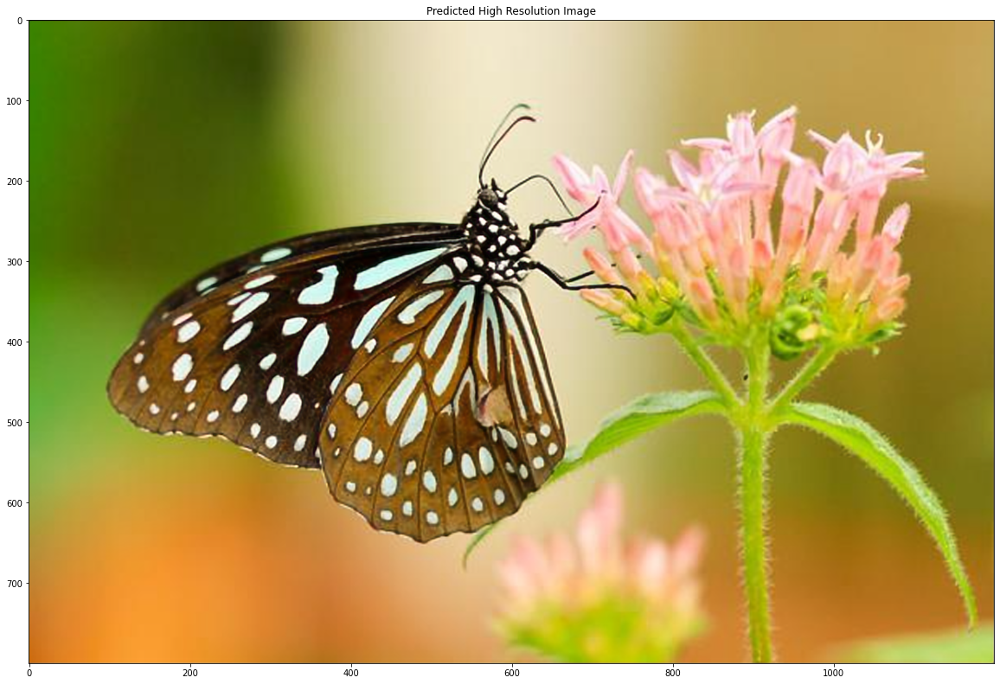

In [ ]:
n = 0
for i,m in val_generator:
    img,mask = i,m
    sr1 = autoencoder.predict(img)
    if n < 2:
        fig, axs = plt.subplots(1 , 1, figsize=(20,20))
        fig_1, axs_1 = plt.subplots(1 , 1, figsize=(20,20))
        fig_2, axs_2 = plt.subplots(1 , 1, figsize=(20,20))
        axs.imshow(img[0])
        axs.set_title('Low Resolution Image')
        axs_1.imshow(mask[0])
        axs_1.set_title('High Resolution Image')
        axs_2.imshow(sr1[0])
        axs_2.set_title('Predicted High Resolution Image')
        plt.show()
        n+=1
    else:
        break

### 5.3 Saving the Model for Future Use

In the final cell, we save the trained autoencoder model so it can be reused for future image enhancement tasks. By saving the model, we preserve all learned parameters, enabling us to load and deploy the model without retraining.

- **Saving the Model**:
  - **`model.save('super_resolution_autoencoder.h5')`**: Saves the entire model structure and weights in H5 format.
  - **`load_model('super_resolution_autoencoder.h5')`**: When needed, this command will load the saved model to make high-resolution predictions on new images without retraining.

Saving the model ensures that the time spent training can be leveraged in practical applications, making it possible to deploy the autoencoder model for real-time image super-resolution tasks in future projects.


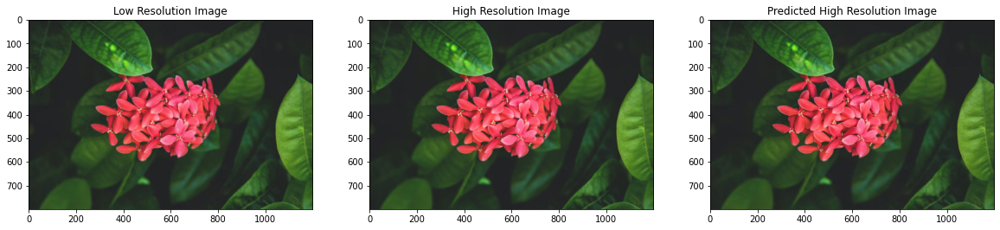

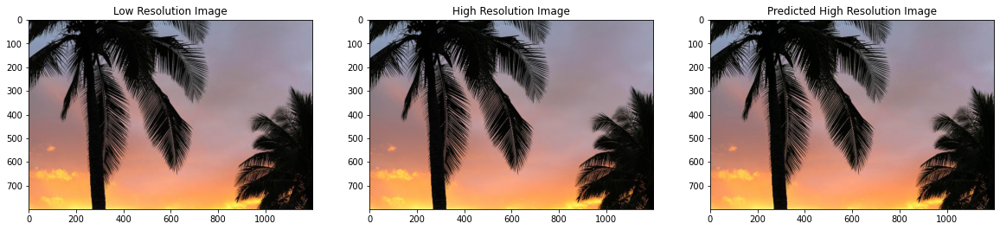

In [ ]:
n = 0
for i,m in val_generator:
    img,mask = i,m
    sr1 = autoencoder.predict(img)
    if n < 2:
        fig, axs = plt.subplots(1 , 3, figsize=(20,20))
        axs[0].imshow(img[0])
        axs[0].set_title('Low Resolution Image')
        axs[1].imshow(mask[0])
        axs[1].set_title('High Resolution Image')
        axs[2].imshow(sr1[0])
        axs[2].set_title('Predicted High Resolution Image')
        plt.show()
        n+=1
    else:
        break